# Clustering

Problems:




In [1]:
# Useful starting lines
%matplotlib inline
import copy
#import matplotlib as mpl
import datetime as dt

import re
import glob
import ast
from datetime import datetime
from collections import Counter
import itertools
import nltk
nltk.download("stopwords")
from nltk import bigrams 
from nltk.corpus import stopwords
import string
import locale
import reverse_geocoder as rg
import dask.dataframe as dd
import pickle
locale.setlocale(locale.LC_TIME, "en_US.utf8")
%load_ext autoreload

[nltk_data] Downloading package stopwords to /home/servan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [1]:
#packages to manipulate data structures
import pandas as pd
from sklearn.utils import shuffle
import numpy as np 
from sklearn import preprocessing
import scipy.sparse as sps
import itertools
from copy import deepcopy

#packages for machine learning model
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import ward_tree

#packages for parallelisation
from joblib import Parallel, delayed
import multiprocessing as mp
import heapq

#packages for data visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import pygraphviz
from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon
import shapely

## Start from here if "states_4m.pkl" and "vec_sent_4m.pkl already exist

In [ ]:
y_start = pd.read_pickle("coord_states_4m.pkl")
x_start = pd.read_pickle("vec_sent_4m.pkl")

In [ ]:
x_start = x_start.loc[:,0:699]
#y_start = y_start.loc[:,1]

In [ ]:
subset = 4000

In [33]:
Y = y_start.loc[0:subset]
X = x_start.loc[0:subset,0:699]
#X,Y = shuffle(X,Y,random_state=2)

In [34]:
coords = pd.DataFrame(Y['coord'].values.tolist(), columns=['lat','lon'])

In [35]:
coords

,lat,lon
0,33.043320,-117.293376
1,32.790221,-117.172053
2,34.964845,-82.031991
3,30.265296,-81.493206
4,35.354958,-79.299060
5,35.991613,-115.219772
6,32.415051,-99.750556
7,37.676838,-113.130172
8,33.413384,-111.923823
9,32.815298,-116.915786


In [332]:
#joint = pd.concat([x_start,y_start],axis=1)
_lambda = 0.1
X[['lat','lon']] = pd.DataFrame(Y['coord'].values.tolist(), columns=['x','y'])
X['lat'] = X['lat'].apply(lambda x: x*_lambda)
X['lon'] = X['lon'].apply(lambda x: x*_lambda)
print (X)

               0         1         2         3         4         5         6  \
0       0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
1      -0.057968  0.239050 -0.157540 -0.102330 -0.052477  0.398420  0.030478   
2      -0.069931  0.052453  0.071276  0.110880 -0.026561  0.212230 -0.244550   
3      -0.001827  0.011836 -0.087708  0.146680 -0.229120  0.098161  0.154060   
4      -0.101660 -0.082736  0.072445  0.007983 -0.006668  0.233310  0.147490   
5      -0.117000  0.078228 -0.074029 -0.037452 -0.063964  0.155570 -0.022898   
6      -0.111680  0.212090  0.097589 -0.124490  0.027603  0.030855  0.037793   
7      -0.225290 -0.170080  0.056797  0.112650 -0.038840 -0.043256  0.035797   
8       0.069042  0.009077  0.117250  0.348340 -0.043387  0.146760 -0.128050   
9      -0.127140 -0.130130 -0.180420 -0.140870  0.042621 -0.025003 -0.001276   
10      0.273310  0.143440 -0.047267 -0.049857  0.109150  0.172220  0.000752   
11     -0.127440 -0.055781  0.053006  0.

In [36]:
Y = Y["state"]

In [37]:
states_dict = {
#        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        #'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DC1':'Washington, D.C.',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
#        'GU': 'Guam',
#        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        #'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        #'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        #'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}

#linguistic regions: https://www.washingtonpost.com/blogs/govbeat/wp/2013/12/02/what-dialect-to-do-you-speak-a-map-of-american-english/?utm_term=.1156615c2e39
lingo_regions = {"West": ("Washington","Oregon","California","Idaho",
                "Montana","Nevada","Arizona","Utah","Wyoming","North Dakota",
                "South Dakota","Nebraska","Kansas","Oklahoma","Colorado",
                "New Mexico","Texas","Missouri","Iowa"),
                "UpperNorth": ("Minnesota","Wisconsin","Michigan","New York",
                "Massachusetts","Vermont","New Hampshire","Maine","Rhode Island",
                "Connecticut"),
                "LowerNorth": ("Pennsylvania","New Jersey","Ohio","Indiana","Illinois"),
                "UpperSouth": ("Delaware","Maryland","Washington, D.C.","West Virginia",
                "Kentucky","Tennessee"),
                "LowerSouth": ("Virginia","North Carolina","South Carolina","Georgia",
                "Florida","Alabama","Mississippi","Louisiana","Arkansas")}


In [38]:
#get state adjacency
with open("stateadjacency.txt") as f:
    states_ad = f.read().splitlines() 
states_ad = [i.split(",") for i in states_ad]

for k in range(0,len(states_ad)):
    states_ad[k] = [states_dict.get(item) for item in states_ad[k]]

#revome states that are not in our subset
states_ad = [i for i in states_ad if i!=[None]]
states_ad

[['Alabama', 'Mississippi', 'Tennessee', 'Georgia', 'Florida'],
 ['Arkansas',
  'Missouri',
  'Tennessee',
  'Mississippi',
  'Louisiana',
  'Texas',
  'Oklahoma'],
 ['Arizona', 'California', 'Nevada', 'Utah', 'Colorado', 'New Mexico'],
 ['California', 'Oregon', 'Nevada', 'Arizona'],
 ['Colorado',
  'Wyoming',
  'Nebraska',
  'Kansas',
  'Oklahoma',
  'New Mexico',
  'Arizona',
  'Utah'],
 ['Connecticut', 'New York', 'Massachusetts', 'Rhode Island'],
 ['District of Columbia', 'Maryland', 'Virginia'],
 ['Delaware', 'Maryland', 'Pennsylvania', 'New Jersey'],
 ['Florida', 'Alabama', 'Georgia'],
 ['Georgia',
  'Florida',
  'Alabama',
  'Tennessee',
  'North Carolina',
  'South Carolina'],
 ['Iowa',
  'Minnesota',
  'Wisconsin',
  'Illinois',
  'Missouri',
  'Nebraska',
  'South Dakota'],
 ['Idaho', 'Montana', 'Wyoming', 'Utah', 'Nevada', 'Oregon', 'Washington'],
 ['Illinois', 'Indiana', 'Kentucky', 'Missouri', 'Iowa', 'Wisconsin'],
 ['Indiana', 'Michigan', 'Ohio', 'Kentucky', 'Illinois'],


In [39]:
to_keep = Y.isin(states_dict.values())
print("Removed a total of "+ str(sum(~to_keep)) + " rows")
Y = Y[to_keep]
Y.index = range(0,np.shape(Y)[0])

Removed a total of 198549 rows


In [40]:
len(Y)

3801452

In [41]:
Y[Y=="Washington, D.C."] = "District of Columbia"
states = np.unique(Y)
#states[states=="Washington, D.C."] = "District of Columbia"

In [42]:
X = X[to_keep]
X.index = range(0,np.shape(X)[0])

In [43]:
coords = coords[to_keep]

In [45]:
from sklearn.preprocessing import scale
X = scale(X)

In [161]:
#X = X[["lat","lon"]]

In [47]:
n_clusts = range(250,10000,250)

39

## MiniBatch k-means

In [ ]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.cluster import DBSCAN
n_clusts = range(250,10000,250)
models = []
labels = []
Y1_vecs = []
for i in n_clusts:
    cluster_model = MiniBatchKMeans(n_clusters=i,max_iter=100,batch_size=5000,
                               verbose=0,compute_labels=True,
                               random_state=10)
    #cluster_model = DBSCAN(eps=0.5, min_samples=5, metric="cosine", 
    #                       metric_params=None, algorithm="brute", leaf_size=30, p=None, n_jobs=8)
    models.append(cluster_model)
    cluster_model.fit(X)
    label = pd.Series(cluster_model.predict(X))
    labels.append(label)
    Y1 = pd.concat([Y,label],1)
    Y1.columns = range(0,np.shape(Y1)[1])
    Y1_vecs.append(Y1)
    


In [ ]:
with open("cluster_models.pkl", "wb") as f:
    for model in models:
         pickle.dump(model, f)

In [ ]:
models2 = []
with open("cluster_models.pkl", "rb") as f:
    while True:
        try:
            models.append(pickle.load(f))
        except EOFError:
            break

In [29]:
from scipy.interpolate import griddata as gd
def tweet_plotter(cluster_model,Y1):
    plt.figure(num=None, figsize=(20, 12), dpi=80, facecolor='w', edgecolor='k')
    m = Basemap(llcrnrlon=-119,llcrnrlat=20,urcrnrlon=-64,urcrnrlat=49,
            projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
    # load the shapefile, use the name 'states'
    m.readshapefile('st99_d00', name='states', drawbounds=True)
    #ax = plt.gca() # get current axes instance
    #x,y = m(list(X["lon"].apply(lambda x: x/_lambda)),list(X["lat"].apply(lambda x: x/_lambda)))
    x,y = m(list(coords["lon"]),list(coords["lat"]))
    # Step size of the mesh. Decrease to increase the quality of the VQ.
    #h = .02     # point in the mesh [x_min, x_max]x[y_min, y_max].

    # Plot the decision boundary. For that, we will assign a color to each
    #x_min, x_max = -125, -67
    #y_min, y_max = 25,49
    #xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    
    # Obtain labels for each point in mesh. Use last trained model.
    #make sure to switch position off xx & yy > model was trained in order "lat" & "lon" instead of "lon" & "lat"
    #Z = cluster_model.predict(np.c_[yy.ravel(),xx.ravel()])
    #Z = Z.reshape(xx.shape)
    #xx,yy = m(xx,yy)
    
    m.scatter(x, y, c=Y1[1], cmap='tab20', s=50,alpha=0.75)
    #centers = cluster_model.cluster_centers_
    #cx,cy = m(list(centers[:,1]),list(centers[:,0]))
    #m = plt.scatter(cx,cy, c='black', s=200, alpha=0.5)
    
    #con = plt.contourf(xx, yy , Z, c=Y1[1], cmap='tab20',alpha=0.5)
    plt.show()

/home/servan/anaconda3/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/servan/anaconda3/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


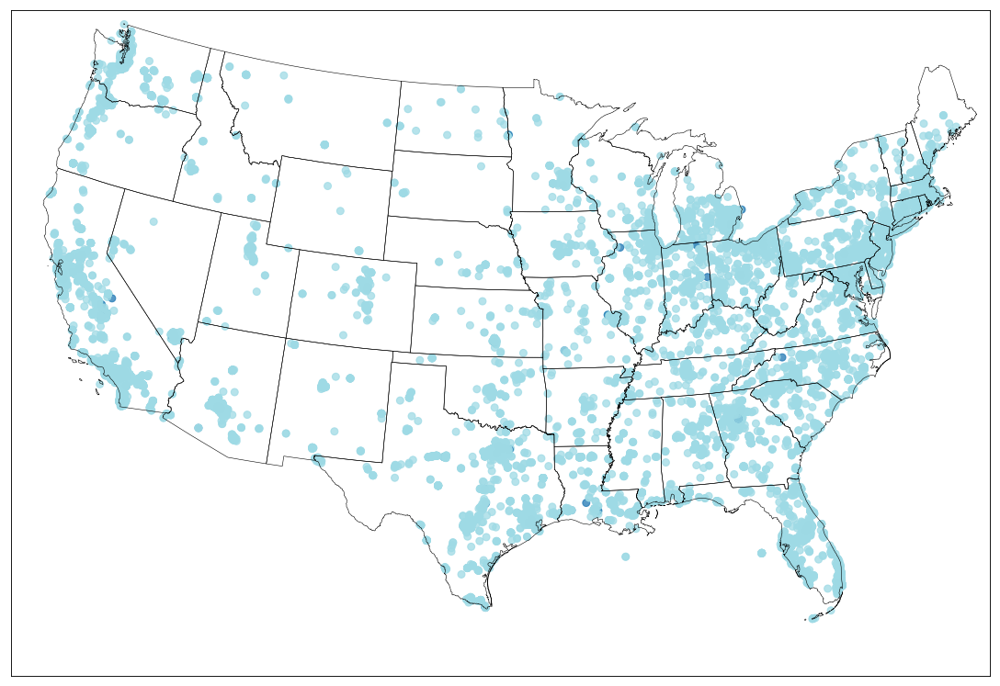

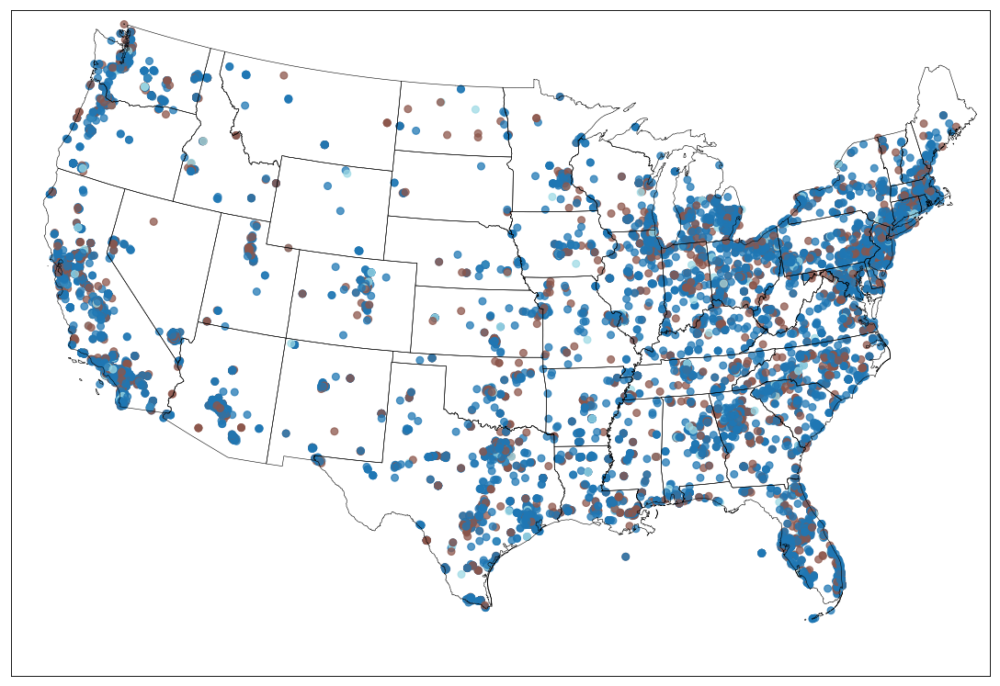

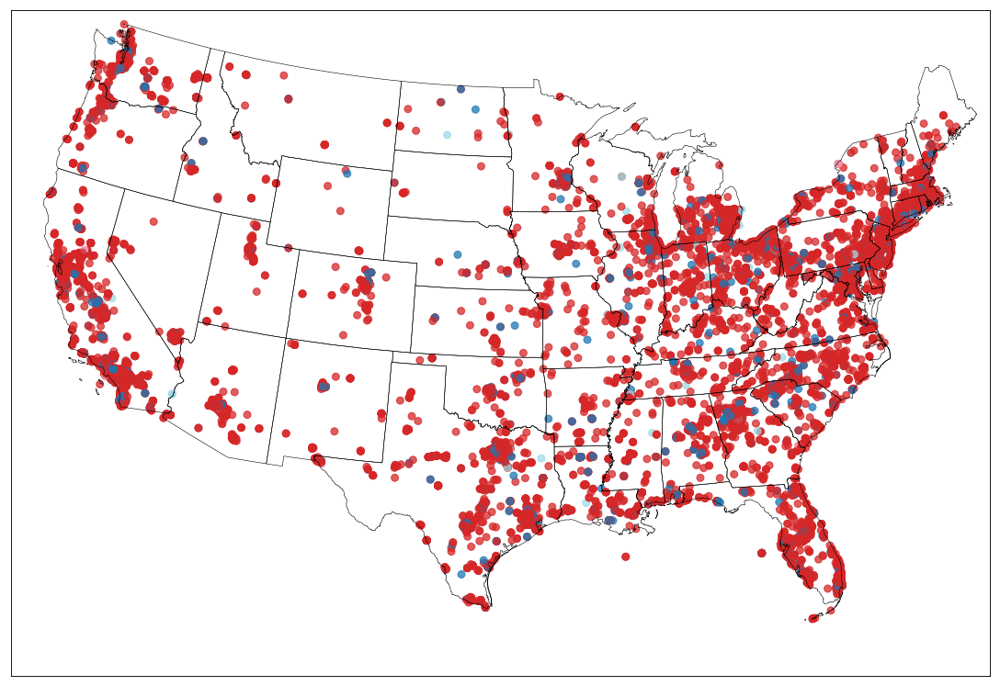

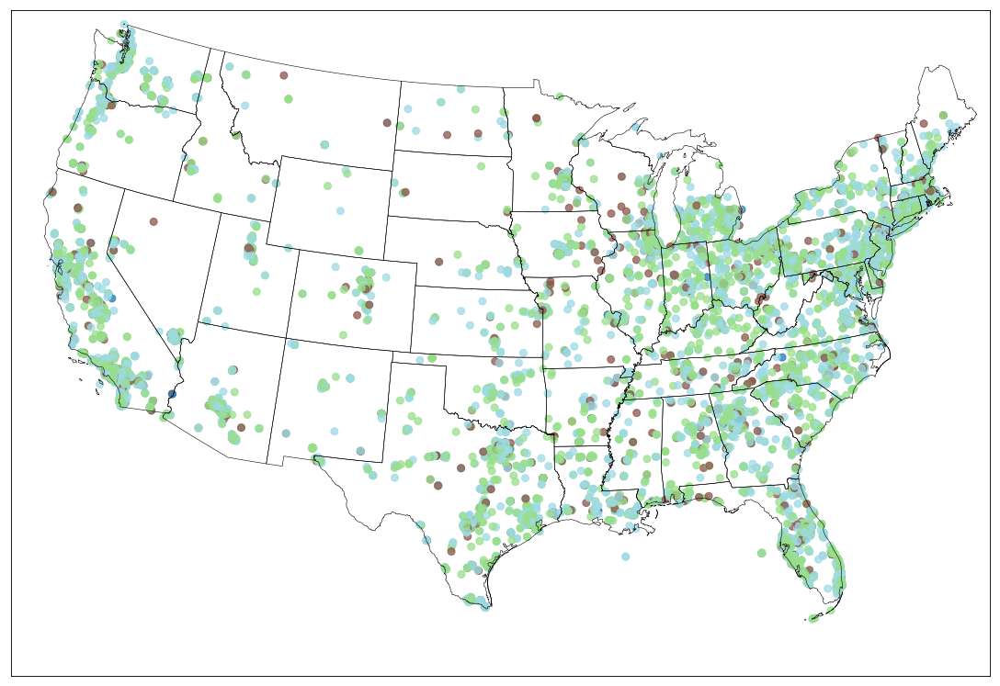

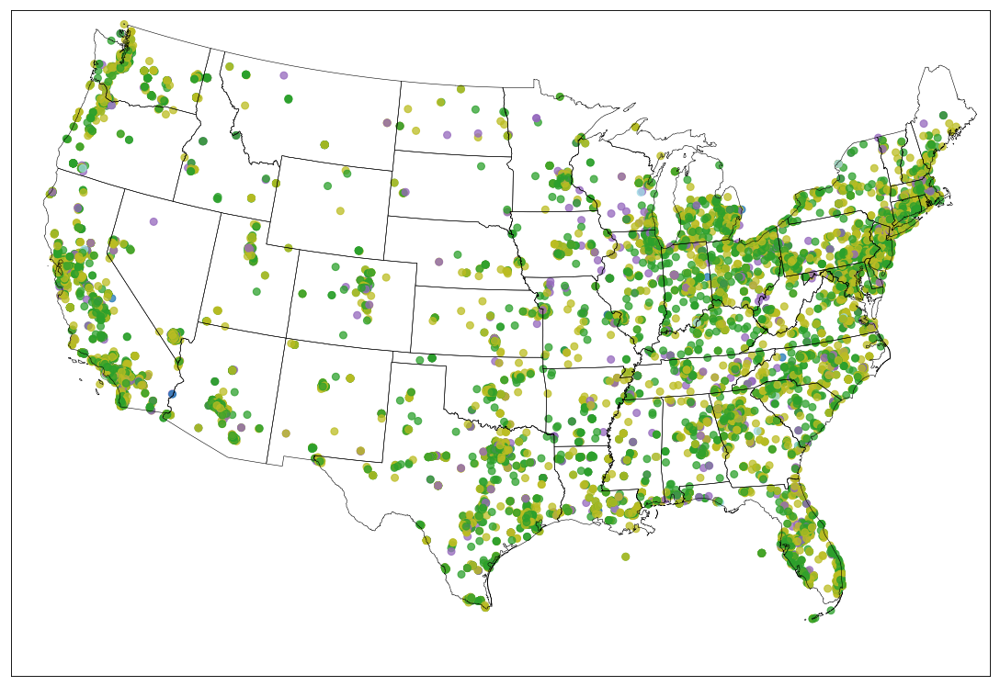

...

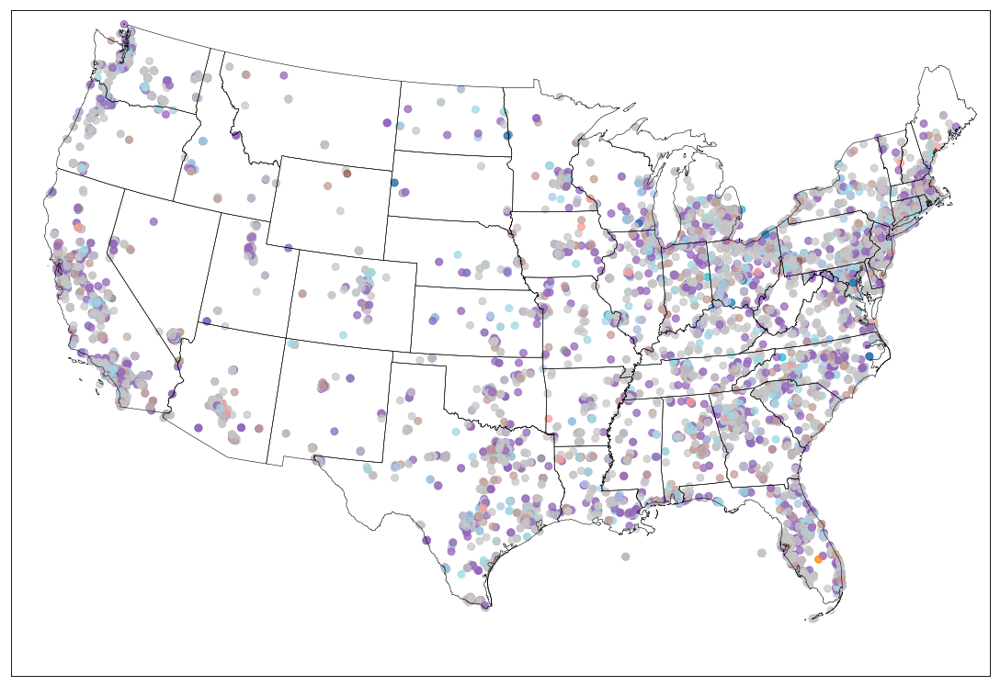

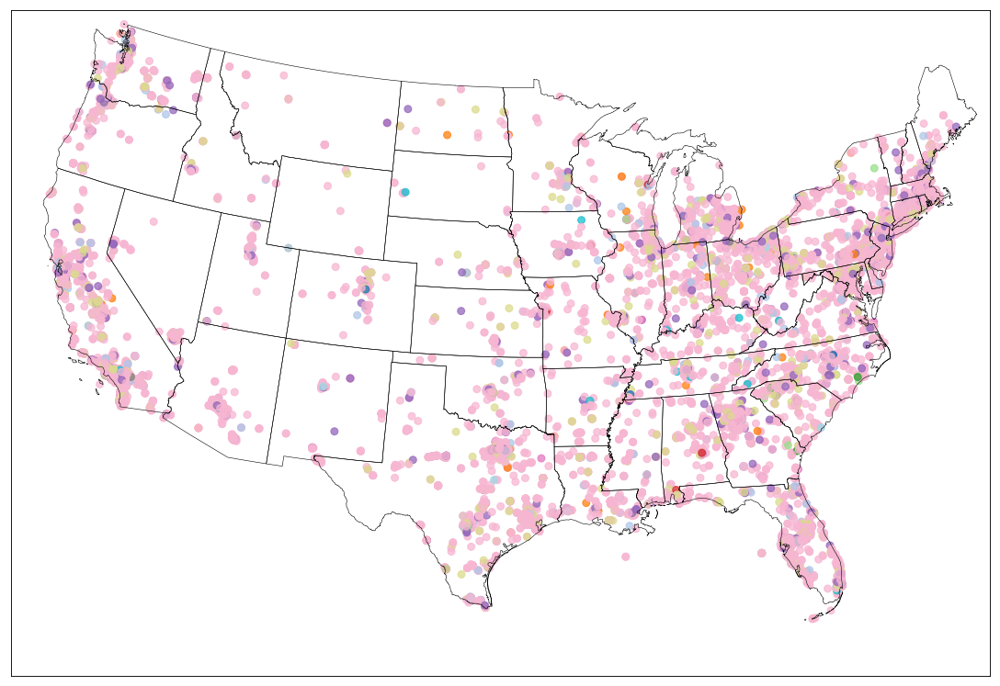

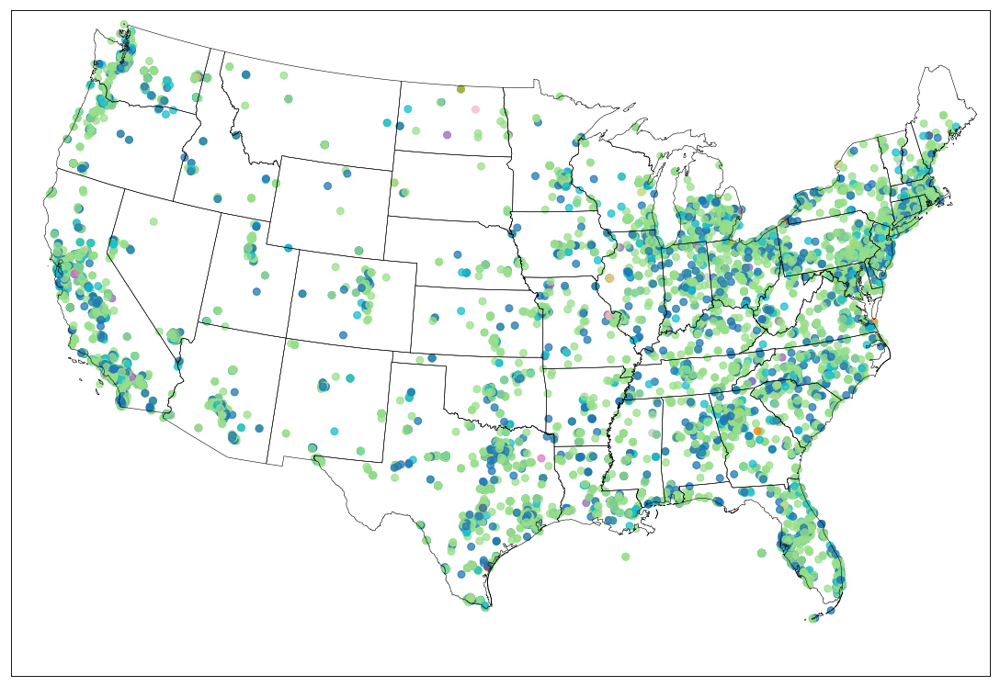

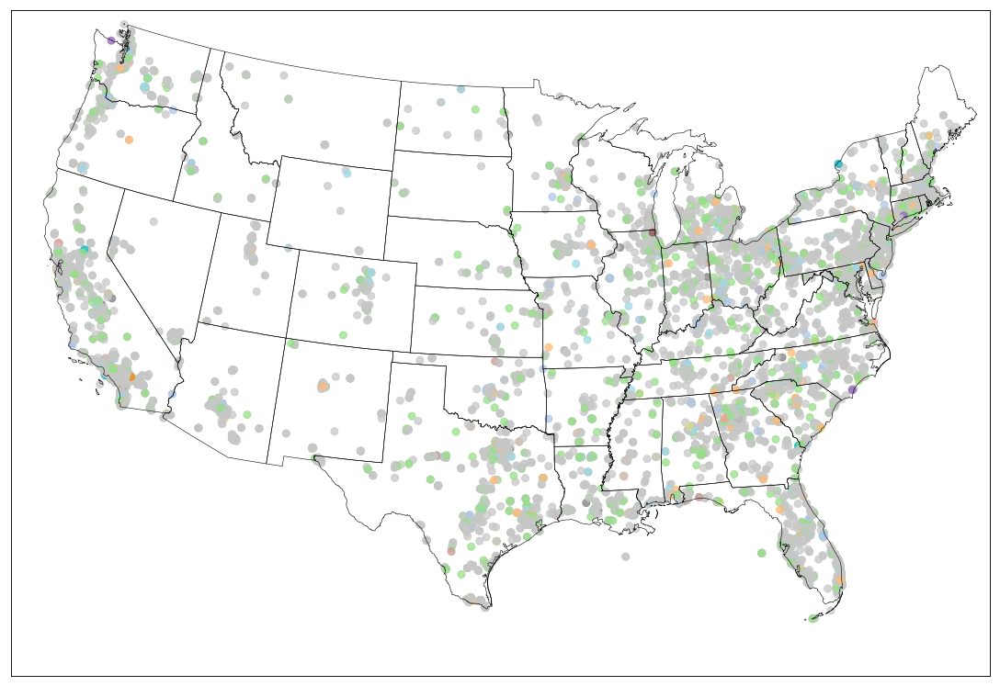

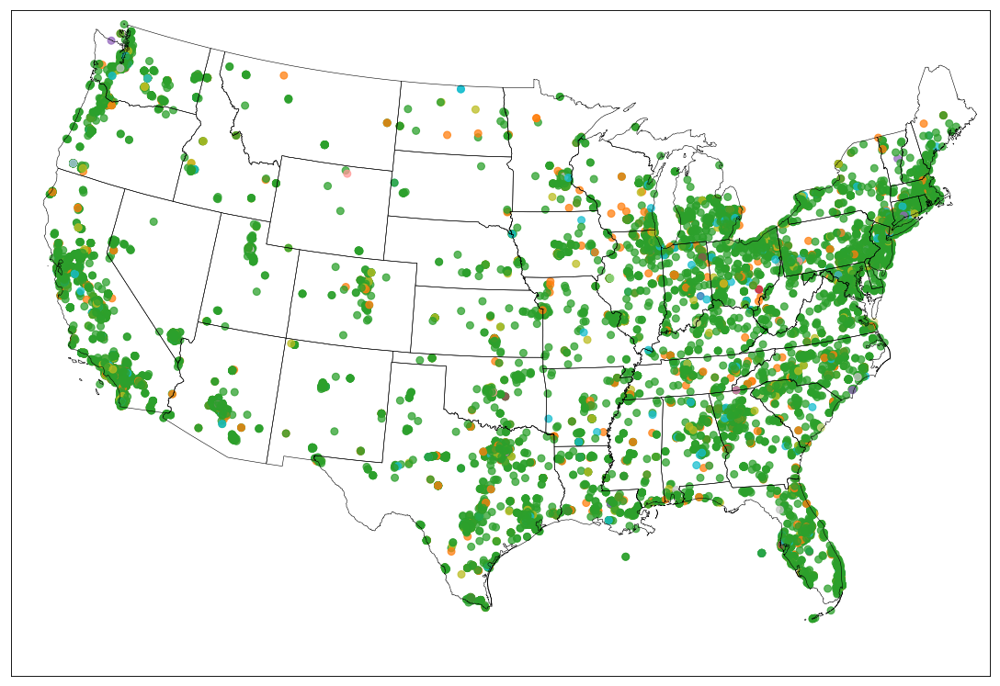

In [30]:
for i in range(0,len(Y1_vecs)):
    tweet_plotter(models[i],Y1_vecs[i])

/home/servan/anaconda3/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/home/servan/anaconda3/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


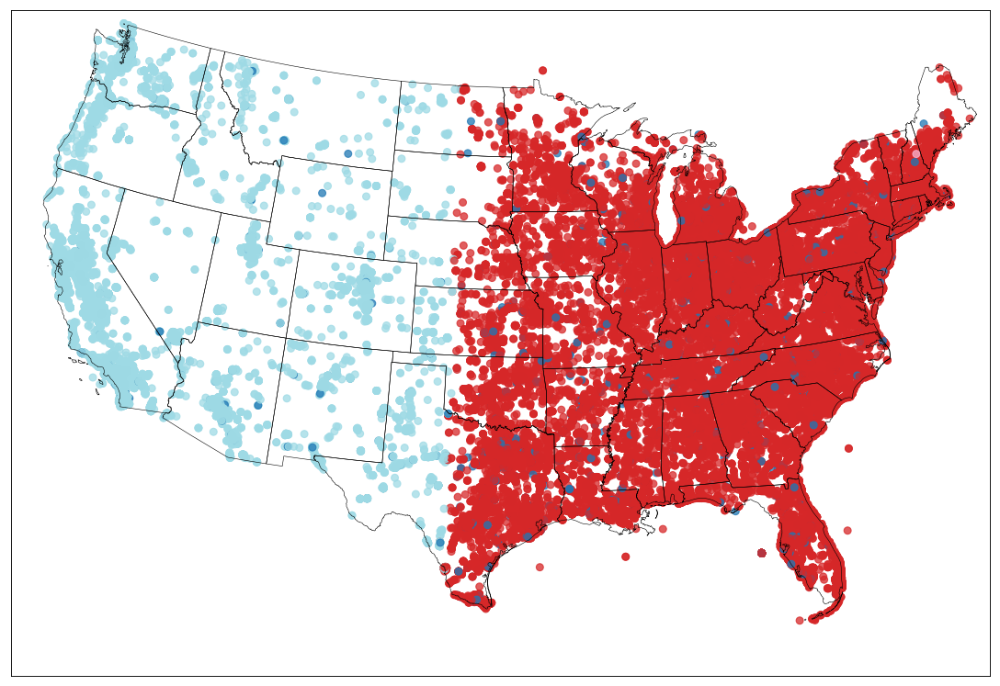

In [352]:
tweet_plotter(models[2],Y1_vecs[2])

In [163]:
def categ_calculator_new(Y1,states_ad,neigh=False):
    categs = []
    indices = list(pd.DataFrame(states_ad)[0])
    nr_states = len(pd.unique(Y1[0]))
    cat_sum = [sum(Y1[1]==i) for i in range(0,len(pd.unique(Y1[1])))]
    print(cat_sum)
    state_sum = [sum(Y1[0]==i) for i in range(0,nr_states)]
    for i in indices:
        #state = i
        #neighbours = states_ad[i]
        state = Y1[Y1[0]==i]
        categ_state = [sum(state[1]==j) for j in range(0,len(pd.unique(Y1[1])))]
        categ_state_rel = [categ_state[l]/cat_sum[l] for l in range(0,len(pd.unique(Y1[1])))]
        """
        categ_sums = np.zeros(len(pd.unique(Y1[1])))
        for k in neighbours:
            state = Y1[Y1[0]==k]
            categ_sums = categ_sums + [sum(state[1]==j) for j in range(0,len(pd.unique(Y1[1])))]
        categ_rel = [categ_sums[l]/cat_sum[l] for l in range(0,len(pd.unique(Y1[1])))]
        """
        arg_state = np.argmax(categ_state_rel)
        #arg_neigh = np.argmax(categ_rel)
        if False: #arg_neigh!=arg_state:
            print(i)
            print(categ_rel)
            print(categ_state_rel)
            print(categ_state)
            print(neighbours)
        #print(categ_rel)
        #print(np.argmax(categ_rel))
        #if True:
        #    categs.append(np.argmax(categ_state_rel))
        if neigh:
            if np.max(categ_state_rel)==1:
                print("case1")
                categs.append(np.argmax(categ_state_rel))
            elif np.max(categ_rel)==1:
                sec_larg = heapq.nlargest(2, range(0,len(categ_rel)), key=categ_rel.__getitem__)
                categs.append(sec_larg[1])
                print("case2")
            else:
                categs.append(np.argmax(categ_rel))
        else:
            categs.append(np.argmax(categ_state_rel))
        #categs.append(np.argmax(categ_rel))
    print(len(categs))
    return(categs)
    #print(categ_rel)
    #print(np.argmax(categ_rel))
    #print(categ_rel)

In [164]:
def state_plotter_old(Y1):
    nr_states = len(pd.unique(Y1[0]))
    """
    nr_states = len(pd.unique(Y1[0]))
    cat_sum = [sum(Y1[1]==i) for i in range(0,len(pd.unique(Y1[1])))]
    state_sum = [sum(Y1[0]==i) for i in range(0,nr_states)]

    categs = []
    for i in range(0,nr_states):
        state = Y1[Y1[0]==i]
        categ_sums = [sum(state[1]==j) for j in range(0,len(pd.unique(Y1[1])))]
        categ_rel = [categ_sums[k]/cat_sum[k] for k in range(0,len(pd.unique(Y1[1])))]
        #print(categ_rel)
        #print(np.argmax(categ_rel))
        #print(categ_rel)
        categs.append(np.argmax(categ_rel))
    
    print(categs)
    """
    categs = categ_calculator_new(Y1,states_ad)
    uniq_categs = pd.unique(categs)
    cols = plt.cm.tab10(uniq_categs)

    # create the map
    map = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
            projection='lcc',lat_1=33,lat_2=45,lon_0=-95)

    # load the shapefile, use the name 'states'
    map.readshapefile('st99_d00', name='states', drawbounds=True)

    # collect the state names from the shapefile attributes so we can
    # look up the shape obect for a state by it's name
    state_names = []
    for shape_dict in map.states_info:
        state_names.append(shape_dict['NAME'])
    print(len(state_names))
    ax = plt.gca() # get current axes instance

    # get states and draw the filled polygon
    for i in range(0,nr_states):
        #seg = map.states[state_names.index(states[i])]
        #seg = map.states[state_names.index("Michigan")]
        indices = [k for k, x in enumerate(state_names) if x == states[i]]
        col = categs[i]
        ind = uniq_categs==col
        col = list(cols[ind])[0]
        for j in range(0,len(indices)):
            seg = map.states[indices[j]]
            poly = Polygon(seg, facecolor=col,edgecolor=col)
            ax.add_patch(poly)

    plt.show()

[6721, 8833, 3514]
49
273


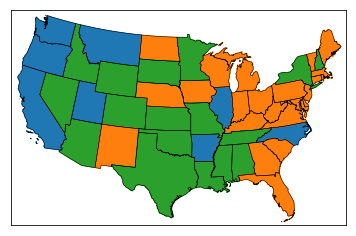

In [165]:
state_plotter_old(Y1_vecs[1])

[12027, 7041]
49
273


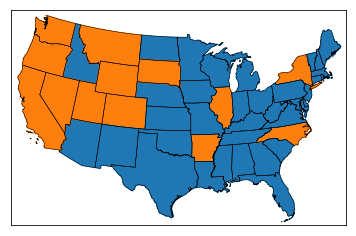

[6721, 8833, 3514]
49
273


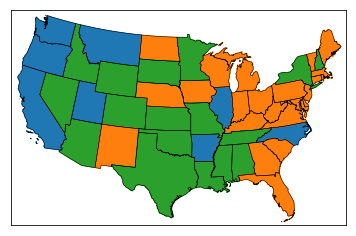

[2819, 6721, 3381, 6147]
49
273


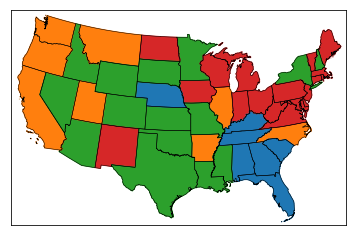

[4363, 5554, 2973, 1167, 5011]
49
273


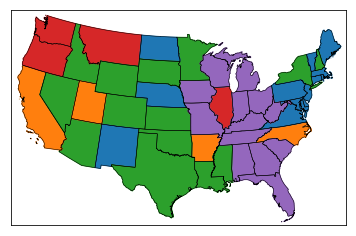

[5554, 3030, 2523, 4029, 2765, 1167]
49
273


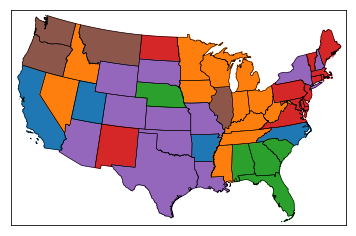

[2614, 5556, 3614, 2583, 1369, 2165, 1167]
49
273


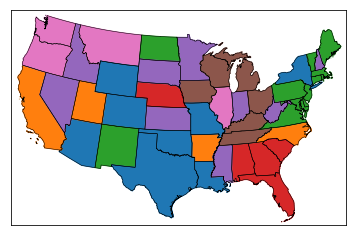

[1077, 5407, 3862, 2506, 1146, 1915, 2667, 488]
49
273


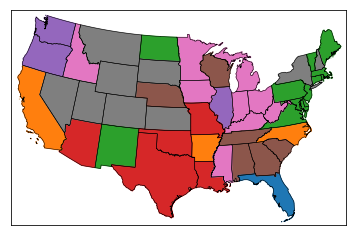

[1894, 4873, 3911, 2489, 1118, 2664, 1076, 390, 653]
49
273


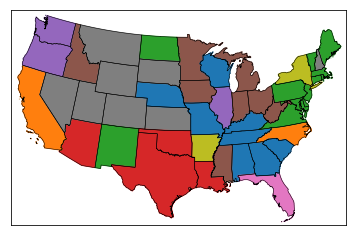

[5377, 3551, 788, 1931, 1139, 1085, 479, 1200, 1915, 1603]
49
273


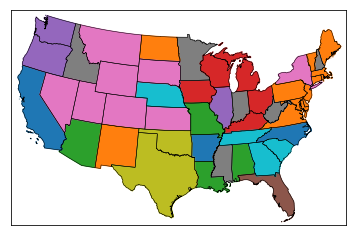

[698, 1413, 2655, 2157, 1151, 1205, 2239, 1086, 1825, 3224, 1415]
49
273


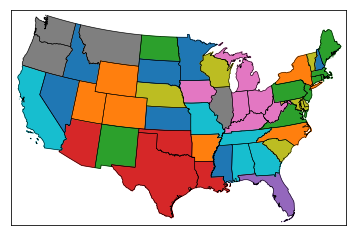

[838, 1327, 1393, 1932, 996, 1117, 1748, 4338, 1115, 2551, 546, 1167]
49
273


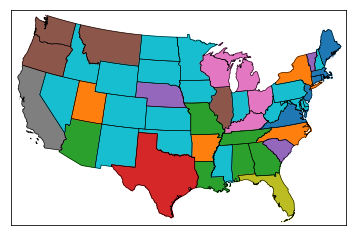

[3742, 1410, 1888, 1910, 1086, 508, 1387, 1080, 907, 1748, 1206, 1395, 801]
49
273


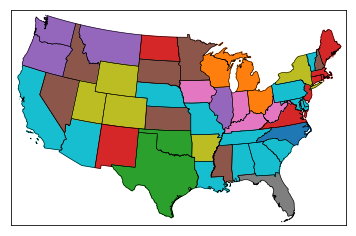

[3715, 1468, 1889, 1072, 1082, 2435, 385, 1243, 1309, 1206, 468, 1495, 719, 582]
49
273


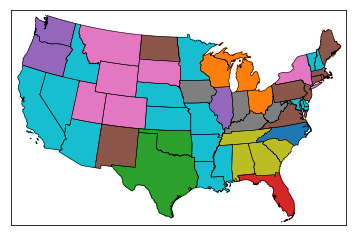

[800, 3739, 859, 1072, 1204, 621, 1754, 1082, 1363, 333, 1952, 726, 1157, 594, 1812]
49
273


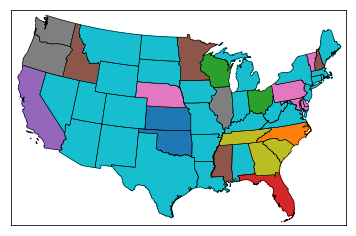

[1205, 1054, 1704, 320, 1725, 1086, 1099, 1119, 1195, 265, 1832, 3191, 1439, 803, 697, 334]
49
273


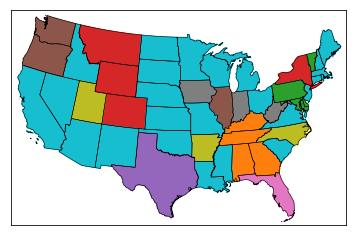

[1098, 822, 1308, 1079, 1444, 693, 1165, 1239, 1901, 1072, 535, 201, 323, 1420, 1095, 3208, 465]
49
273


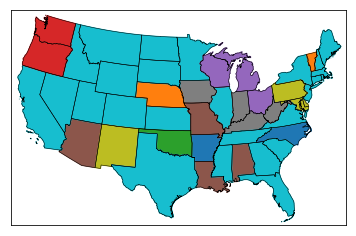

[1100, 3192, 1441, 767, 1072, 1083, 1877, 1309, 656, 1204, 1423, 273, 567, 1150, 182, 401, 718, 653]
49
273


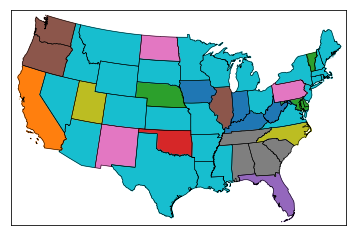

[1079, 1071, 1896, 3737, 405, 674, 652, 331, 1206, 743, 735, 548, 1619, 594, 461, 530, 788, 837, 1162]
49
273


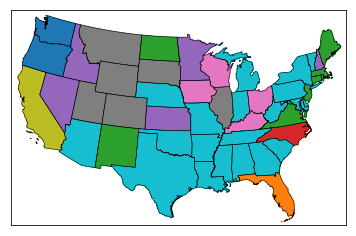

In [166]:
for i in range(0,len(Y1_vecs)):
    state_plotter_old(pd.DataFrame(Y1_vecs[i]))

In [119]:
#transform state strings into integer labels
le = preprocessing.LabelEncoder()
le.fit(Y)
list(le.classes_)
Y = pd.Series(le.transform(Y))

In [120]:
states_ad = [list(le.transform(i)) for i in states_ad]

ValueError: y contains new labels: ['Rhode Island']

In [16]:
states_ad = sorted(states_ad)

In [17]:
#split data into smaller subsets
n_splits = 100
splits = list(range(1,n_splits))
splits = [i/n_splits for i in splits]
Y_splits = np.split(Y, [int(i*len(Y)) for i in splits])
X_splits = np.split(X,[int(i*len(Y)) for i in splits])

In [18]:
for i in X_splits:
    print(len(i))

6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6720
6721
6720
6720
6721


In [19]:
#merged = list(itertools.chain.from_iterable(list2d))
def ad_matrix(Y,states_ad):
    rows = cols = len(Y)
    ad_mat = sps.coo_matrix((rows, cols))
    indices = list(pd.DataFrame(states_ad)[0])
    for j in indices: 
        r = np.where(Y.isin([j]))[0]
        tw_per_state = len(r)
        c = np.where(Y.isin(states_ad[j]))[0]
        #c = np.where(Y.isin([j]))[0]
        neigh_per_tweet = len(c)
        r = np.repeat([r],neigh_per_tweet,axis=1)
        r = list(itertools.chain.from_iterable(r))
        #print(r)
        c = np.repeat([c],tw_per_state,axis=0)
        c = list(itertools.chain.from_iterable(c))
        #print(c)
        d = np.ones(len(c))
        ad_mat = ad_mat + sps.coo_matrix((d, (r, c)), shape=(rows, cols))
    #print(ad_mat)
    return(ad_mat)

def categ_calculator(Y1,states_ad,neigh=False):
    categs = []
    indices = list(pd.DataFrame(states_ad)[0])
    nr_states = len(pd.unique(Y1[0]))
    cat_sum = [sum(Y1[1]==i) for i in range(0,len(pd.unique(Y1[1])))]
    print(cat_sum)
    state_sum = [sum(Y1[0]==i) for i in range(0,nr_states)]
    for i in indices:
        #state = i
        neighbours = states_ad[i]
        state = Y1[Y1[0]==i]
        categ_state = [sum(state[1]==j) for j in range(0,len(pd.unique(Y1[1])))]
        categ_state_rel = [categ_state[l]/cat_sum[l] for l in range(0,len(pd.unique(Y1[1])))]
        categ_sums = np.zeros(len(pd.unique(Y1[1])))
        for k in neighbours:
            state = Y1[Y1[0]==k]
            categ_sums = categ_sums + [sum(state[1]==j) for j in range(0,len(pd.unique(Y1[1])))]
        categ_rel = [categ_sums[l]/cat_sum[l] for l in range(0,len(pd.unique(Y1[1])))]
       
        arg_state = np.argmax(categ_state_rel)
        arg_neigh = np.argmax(categ_rel)
        if False: #arg_neigh!=arg_state:
            print(i)
            print(categ_rel)
            print(categ_state_rel)
            print(categ_state)
            print(neighbours)
        #print(categ_rel)
        #print(np.argmax(categ_rel))
        #if True:
        #    categs.append(np.argmax(categ_state_rel))
        if neigh:
            if np.max(categ_state_rel)==1:
                print("case1")
                categs.append(np.argmax(categ_state_rel))
            elif np.max(categ_rel)==1:
                sec_larg = heapq.nlargest(2, range(0,len(categ_rel)), key=categ_rel.__getitem__)
                categs.append(sec_larg[1])
                print("case2")
            else:
                categs.append(np.argmax(categ_rel))
        else:
            categs.append(np.argmax(categ_state_rel))
        #categs.append(np.argmax(categ_rel))
    print(len(categs))
    return(categs)
    #print(categ_rel)
    #print(np.argmax(categ_rel))
    #print(categ_rel)

def neigh_calc(categs,neigh_mat):
    row = len(neigh_mat)
    print(row)
    #creates a connectivity matrix with ones if states belong to the same cluster and 0 if they dont'
    for j in range(0,row):
        cat_j = categs[j]
        neighs = [(i==cat_j)*1 for i in categs]
        neigh_mat[j,:] = neigh_mat[j,:]+neighs
    return(neigh_mat)


#see http://scikit-learn.org/stable/modules/clustering.html#hierarchical-clustering for agglomerative clustering
def neighbour_finder(X,Y,size=49):
    row = col = size
    neigh_mat_state = np.zeros([row,col])
    neigh_mat_neigh = np.zeros([row,col])
    print("number of unique states",len(np.unique(Y)))
    #calculate adjacency matrix
    rows = cols = len(Y)
    print("Size of ad_mat:",rows)
    ad_mat = sps.coo_matrix((rows, cols))
    indices = list(pd.DataFrame(states_ad)[0])

    ad_mat = ad_matrix(Y,states_ad)
    print("adjacency matrix calculated")
        
    #reduce dimensions via pca
    pca = PCA(n_components=50, 
                     copy=True, whiten=False, svd_solver="auto", tol=0.0, 
                     iterated_power="auto", random_state=None)
    X_pca = pca.fit_transform(X)
        
    print("PCA done")
    #create cluster model
    #agg_cluster = AgglomerativeClustering(n_clusters=5, affinity="cosine", memory=None, connectivity=ad_mat, 
                                        #compute_full_tree="True", linkage="average")
    agg_cluster = AgglomerativeClustering(n_clusters=5, affinity="euclidean", memory=None, connectivity=ad_mat, 
                                        compute_full_tree="False", linkage="ward")
    print("agg_cluster model built")
    labels = pd.Series(agg_cluster.fit_predict(X_pca))
    print("clustering done and labels assigned")
    Y.reset_index(drop=True, inplace=True)
    labels.reset_index(drop=True, inplace=True)

    Y1 = pd.concat([Y,labels],axis=1,ignore_index=True)
    print(pd.unique(Y1[1]))
        
    #calculate majority label for each state, based on values within state only
    #"categs_state" and values in state_neighbourhood conly "categs_neigh"
    categs_state = categ_calculator(Y1,states_ad,neigh=False)
    categs_neigh = categ_calculator(Y1,states_ad,neigh=True)
    print("neighbours calculated")
        
    #calculate neighbour
    neigh_mat_neigh = neigh_calc(categs_neigh,neigh_mat_neigh)
    neigh_mat_state = neigh_calc(categs_state,neigh_mat_state)
    #np.save("neigh_mat_state_200k.npy",neigh_mat_state)
    #np.save("neigh_mat_neigh_200k.npy",neigh_mat_neigh)
    #print(str(i),"th split processed\n")
    
    return([neigh_mat_neigh,neigh_mat_state])

In [20]:
size = 49
zipped_splits = list(zip(X_splits,Y_splits,np.repeat(size,len(X_splits))))

pool = mp.pool.ThreadPool(int(mp.cpu_count()/2))

nei_mat = pool.starmap(neighbour_finder, zipped_splits,chunksize =1)

pool.close()

#sum all resultsq
nei_mat = np.sum(nei_mat,axis=0)
neigh_mat_neigh = nei_mat[0]
neigh_mat_state = nei_mat[1]

np.save("neigh_mat_neigh_600k.npy",neigh_mat_neigh)
np.save("neigh_mat_state_600k.npy",neigh_mat_state)

number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6721
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6721
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6721
number of unique states 49
Size of ad_mat: 6721
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6721
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6721
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_mat: 6720
number of unique states 49
Size of ad_ma

case2
case2
case2case2

case2
PCA done
agg_cluster model built
case2
49
neighbours calculated
49
49
number of unique states 49
Size of ad_mat: 6720
case2
case2
case2
case2
adjacency matrix calculated
49
neighbours calculated
49
case2
49
number of unique states 49
Size of ad_mat: 6721
case1
adjacency matrix calculated
case2
case2
case2
PCA doneadjacency matrix calculated

case2
agg_cluster model built
case2
case2
case2
adjacency matrix calculated
case2
case2
case1
case2
PCA done
agg_cluster model built
case1
PCA done
agg_cluster model built
case2
case2case1
case2

case2
PCA done
agg_cluster model built
case2
49
neighbours calculated
49
49
case2case2

number of unique states 49
Size of ad_mat: 6720
case2
case2
case2
case2
case2case2

49
neighbours calculated
49
case2
49
number of unique states 49
Size of ad_mat: 6720
49
neighbours calculated
49
49case2

49
neighbours calculated
49
number of unique states 49
Size of ad_mat: 6720
49
number of unique statescase2 
49
Size of ad_mat: 6721
cas

49
neighbours calculated
49
49
number of unique states 49
Size of ad_mat: 6720
49
neighbours calculated
49
49
adjacency matrix calculated
number of unique states 49
Size of ad_mat: 6720
adjacency matrix calculated
PCA done
agg_cluster model built
PCA done
agg_cluster model built
adjacency matrix calculated
PCA done
agg_cluster model built
adjacency matrix calculated
PCA done
agg_cluster model built
adjacency matrix calculated
adjacency matrix calculated
PCA done
agg_cluster model built
PCA done
agg_cluster model built
adjacency matrix calculated
PCA done
agg_cluster model built
clustering done and labels assigned
[1 0 2 4 3]
[166, 6548, 2, 1, 3]
clustering done and labels assigned
[1 2 3 0 4]
[2, 6589, 126, 1, 3]
49
[166, 6548, 2, 1, 3]
case2
case2
case2
49
[2, 6589, 126, 1, 3]
case2
case2
case2
case2
case2
case2
case2
case2
case2
case1
case2
case2
case2
case2
case2
case2
49
neighbours calculated
49
49
number of unique states 49
Size of ad_mat: 6720
case2
case1
case2
case2
49
neighbour

case2
case2
case2
49
neighbours calculated
49
49
number of unique states 49
Size of ad_mat: 6720
clustering done and labels assigned
[0 1 3 4 2]
[6618, 98, 2, 1, 1]
49
[186, 100, 1, 6432, 1]
case2
case2
case1
case2
adjacency matrix calculated
PCA done
agg_cluster model built
case2
case1
case2
case2
clustering done and labels assigned
[0 2 1 3 4]
[6714, 3, 1, 1, 1]
clustering done and labels assigned
[4 1 0 2 3]
[20, 240, 2, 1, 6458]
case2
49
[6618, 98, 2, 1, 1]
case2
case2
case1
case1
case1
49
neighbours calculated
49
49
clustering done and labels assigned
[4 0 2 1 3]
number of unique states 49
Size of ad_mat: 6720
[133, 4, 37, 2, 6545]
case2
case2
case2
case2
case2
49
adjacency matrix calculated
[6714, 3, 1, 1, 1]
49
neighbours calculated
49
49
number of unique states 49
Size of ad_mat: 6721
PCA done
agg_cluster model built
49
clustering done and labels assigned
[0 1 4 2 3]
[20, 240, 2, 1, 6458]
[6610, 103, 1, 1, 5]
case2
case2
case2
case2
clustering done and labels assigned
[0 2 1 3 

In [32]:
neigh_mat_neigh = nei_mat[0]/n_splits
neigh_mat_state = nei_mat[1]/n_splits

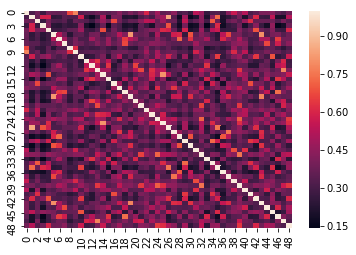

In [33]:
sns.heatmap(np.array(neigh_mat_neigh))

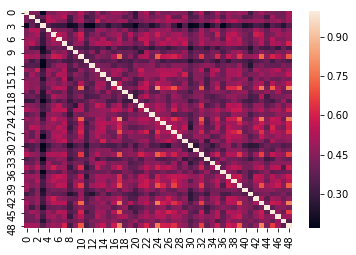

In [34]:
sns.heatmap(np.array(neigh_mat_state))

In [35]:
def find_neigh(ngh_mat,thresh=0.1):
    nghs = []
    for i in range(0,len(ngh_mat)):
        ngh = np.where([j>thresh for j in ngh_mat[i]])
        nghs.append(ngh)
    return(nghs)
        

In [36]:
def prune_edges(ngh_mat,thresh=0.1):
    new_mat = deepcopy(ngh_mat)
    sub_thresh_idx = [j<thresh for j in ngh_mat]
    new_mat[sub_thresh_idx] = 0
    return(new_mat)

In [37]:
test_mat = prune_edges(neigh_mat_neigh,thresh=0.5)
G = nx.from_numpy_matrix(test_mat)

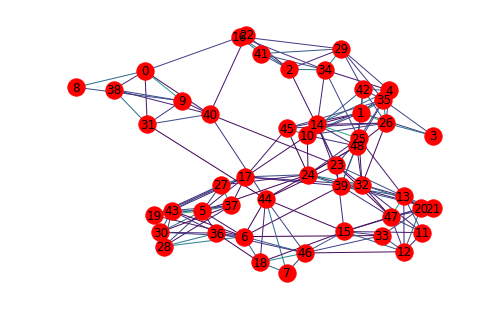

In [38]:
edgewidth = [d['weight']*2 for (u,v,d) in G.edges(data=True)]
pos = nx.spring_layout(G,k=0.4,iterations=40)
nx.draw(G,edge_color=edgewidth,with_labels=True,linewidth=edgewidth,pos=pos)

In [46]:
thresh09 = prune_edges(neigh_mat_neigh,thresh=0.9)
thresh07 = prune_edges(neigh_mat_neigh,thresh=0.7)
thresh06 = prune_edges(neigh_mat_neigh,thresh=0.6)
thresh05 = prune_edges(neigh_mat_neigh,thresh=0.5)
thresh03 = prune_edges(neigh_mat_neigh,thresh=0.3)
thresh01 = prune_edges(neigh_mat_neigh,thresh=0.1)

In [40]:
def state_plotter_new(mat):
    G = nx.from_numpy_matrix(mat)
    # create the map
    plt.figure(num=None, figsize=(20, 12), dpi=80, facecolor='w', edgecolor='k')
    nr_states = len(pd.unique(Y))
    m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
            projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
    # load the shapefile, use the name 'states'
    m.readshapefile('st99_d00', name='states', drawbounds=True)
    state_names = []
    for shape_dict in m.states_info:
        state_names.append(shape_dict['NAME'])
    print(len(state_names))
    ax = plt.gca() # get current axes instance
    pos = {}
    for i in range(0,nr_states):
        #seg = map.states[state_names.index(states[i])]
        #seg = map.states[state_names.index("Michigan")]
        indices = [k for k, x in enumerate(state_names) if x == states[i]]

    
        seg = [np.sum(m.states[k],0) for k in indices]
        nr_seg = [len(m.states[k]) for k in indices]
        seg_avg = [seg[k]/nr_seg[k] for k in range(0,len(seg))]
        seg_avg = np.mean(seg_avg,0)
        pos[i] = (seg_avg[0],seg_avg[1])

    nx.draw(G,with_labels=True,linewidth=edgewidth,pos=pos,node_size=100)

273


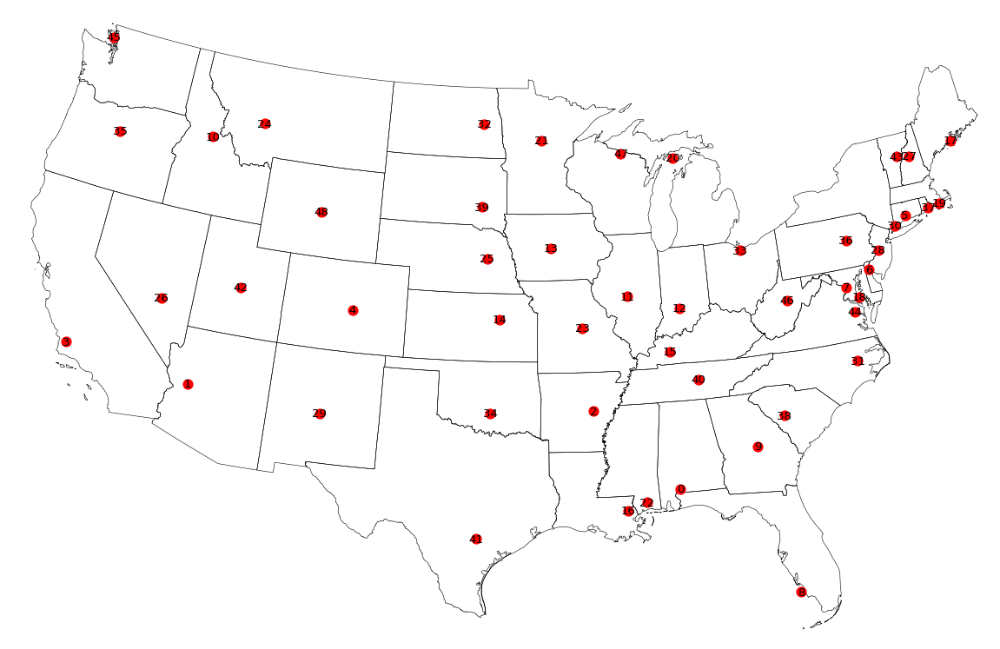

In [41]:
state_plotter_new(thresh09)

273


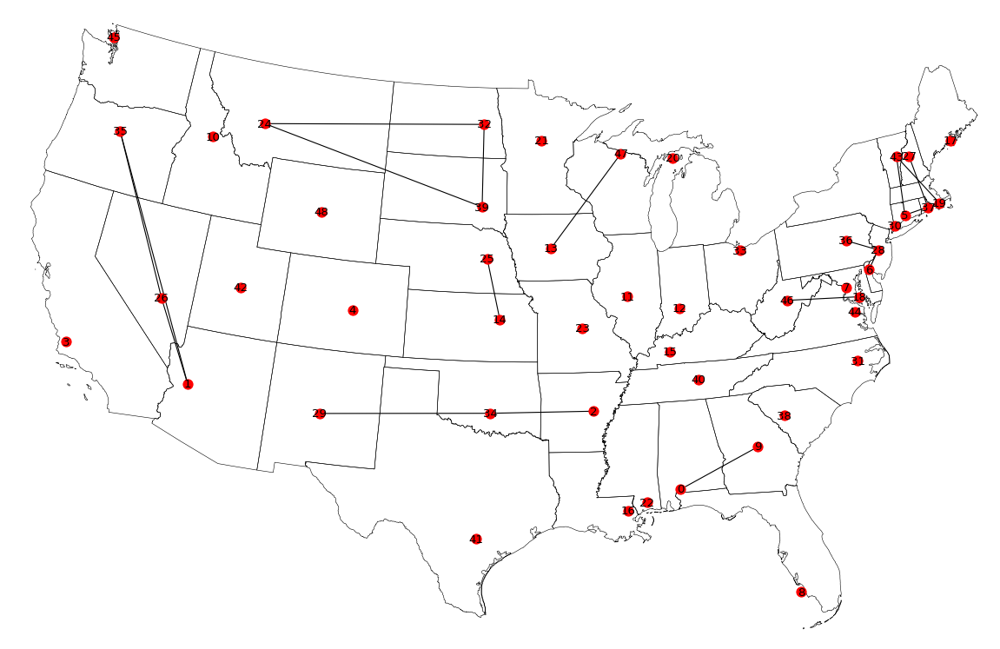

In [42]:
state_plotter_new(thresh07)

273


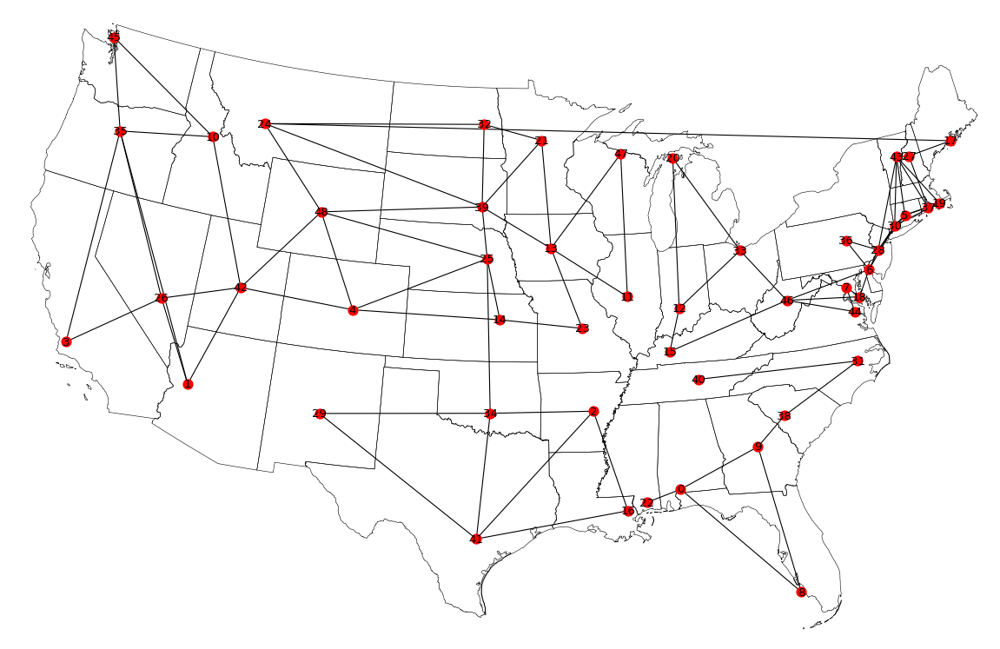

In [47]:
state_plotter_new(thresh06)

273


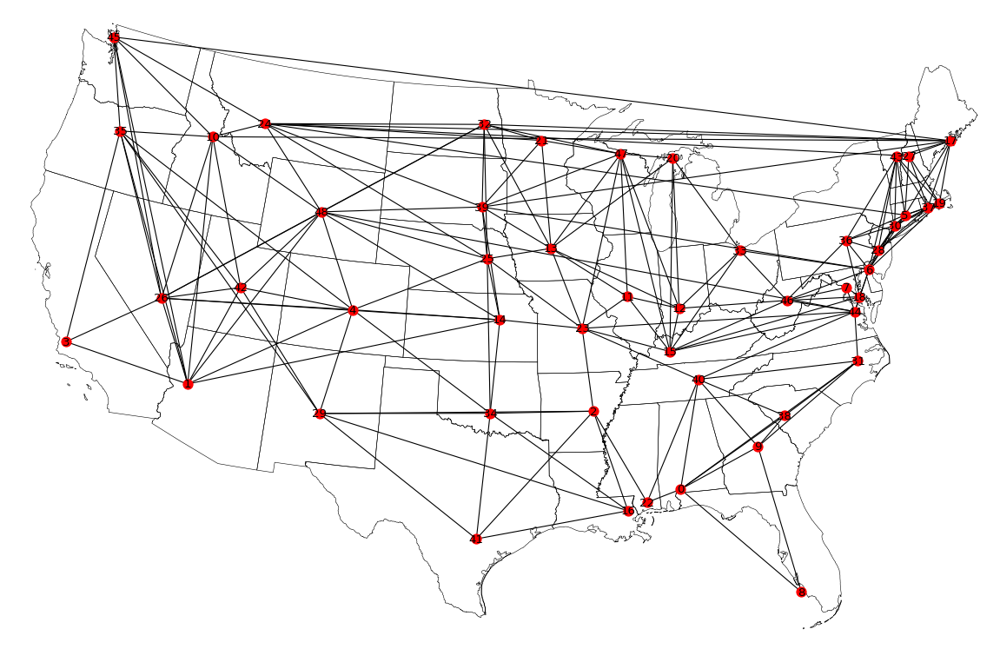

In [43]:
state_plotter_new(thresh05)

273


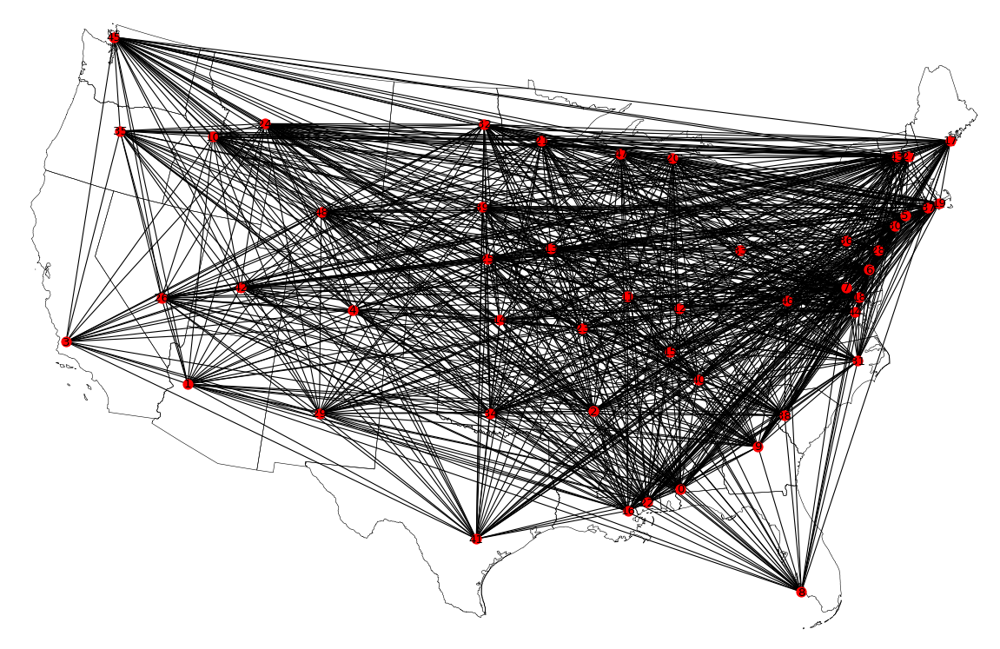

In [44]:
state_plotter_new(thresh03)

273


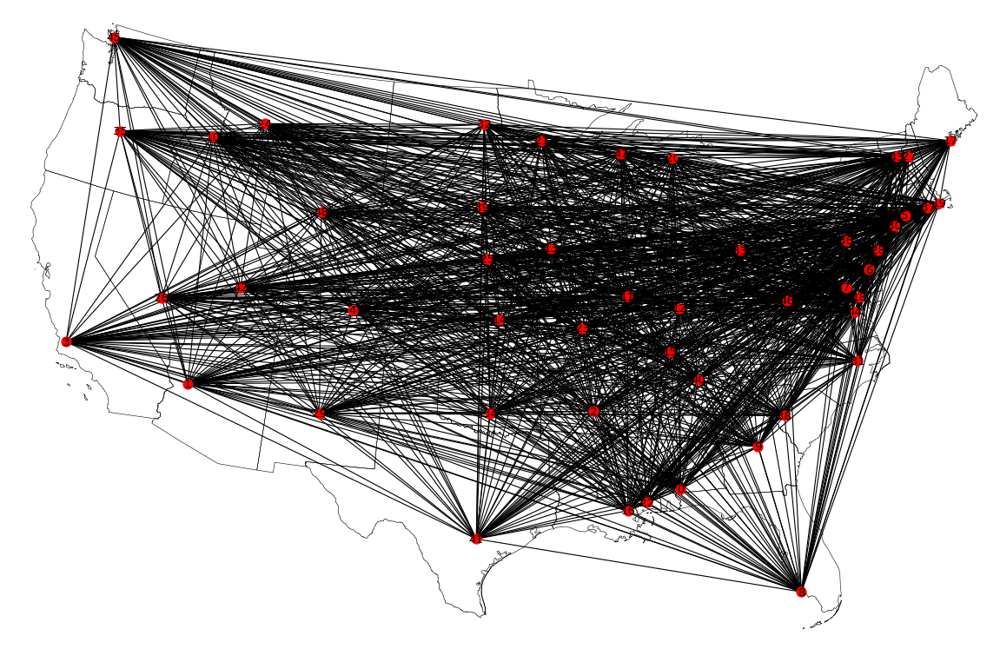

In [45]:
state_plotter_new(thresh01)

# Ignore below

In [64]:
rows = cols = len(Y)
ad_mat = sps.coo_matrix((rows, cols))
indices = list(pd.DataFrame(states_ad)[0])
print(indices)

def comp_ad_mat(j,ad_mat):
    #Y = avg_Y
    r = np.where(Y.isin([j]))[0]
    tw_per_state = len(r)
    c = np.where(Y.isin(states_ad[j]))[0]
    #c = np.where(Y.isin([j]))[0]
    neigh_per_tweet = len(c)
    r = np.repeat([r],neigh_per_tweet,axis=1)
    r = list(itertools.chain.from_iterable(r))
    #print(r)
    c = np.repeat([c],tw_per_state,axis=0)
    c = list(itertools.chain.from_iterable(c))
    #print(c)
    d = np.ones(len(c))
    ad_mat = ad_mat + sps.coo_matrix((d, (r, c)), shape=(rows, cols))
    return(ad_mat)
        
if __name__ == '__main__':
    results = Parallel(n_jobs=mp.cpu_count()-2)(delayed(comp_ad_mat)(j,ad_mat) for j in indices)

ad_mat = sps.coo_matrix((rows, cols))
for i in range(0,len(results)):
    print(i)
    ad_mat = ad_mat + results[i]

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48


In [375]:
#regions = Y
regions = pd.Series(np.zeros(len(Y)))
for i in range(len(lingo_regions.keys())):
    reg_ind = Y.isin(list(lingo_regions.values())[i])
    regions[reg_ind] = [list(lingo_regions.keys())[i]]*sum(reg_ind)
    #regions[reg_ind] = [i]*sum(reg_ind)

In [65]:
ad_mat

<9446x9446 sparse matrix of type '<class 'numpy.float64'>'
	with 14318992 stored elements in Compressed Sparse Row format>

In [48]:
ad_mat

<47340x47340 sparse matrix of type '<class 'numpy.float64'>'
	with 104613790 stored elements in Compressed Sparse Row format>

### read sent-vector

In [25]:
X = tfidf_bigrams[0:10001,:]

In [66]:
print(np.shape(Y))
print(np.shape(X))

(9446,)
(9446, 700)


In [352]:
#dimensionality reduction
pca = PCA(n_components=10, 
                         copy=True, whiten=False, svd_solver="auto", tol=0.0, 
                         iterated_power="auto", random_state=None)
X_pca = pca.fit_transform(X)

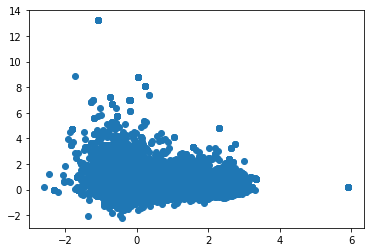

In [361]:
plt.scatter(X_pca[:,1],X_pca[:,3])

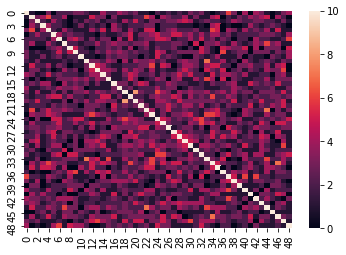

In [348]:
import seaborn as sns
sns.heatmap(np.array(nei_mat[1]))

In [81]:
agg_cluster = AgglomerativeClustering(n_clusters=5, affinity="euclidean", memory=".", connectivity=ad_mat, 
                                        compute_full_tree="auto", linkage="ward")

In [82]:
labels = pd.Series(agg_cluster.fit_predict(X_pca))

In [83]:
labels

0       0
1       0
2       2
3       0
4       2
5       2
6       4
7       2
8       2
9       2
10      3
11      3
12      0
13      0
14      3
15      3
16      2
17      2
18      2
19      2
20      1
21      2
22      2
23      0
24      2
25      0
26      1
27      2
28      2
29      2
       ..
9416    2
9417    0
9418    0
9419    2
9420    2
9421    0
9422    0
9423    4
9424    2
9425    2
9426    0
9427    2
9428    0
9429    2
9430    3
9431    2
9432    2
9433    2
9434    2
9435    2
9436    2
9437    0
9438    2
9439    2
9440    2
9441    2
9442    2
9443    2
9444    2
9445    0
Length: 9446, dtype: int64

In [92]:
Y1 = pd.concat([Y,labels],1)

In [ ]:
Y1.to_pickle("Y1.pkl")

In [ ]:
n_clusts = range(2,15)
models = []
labels = []
Y1_vecs = []
for i in n_clusts:
    cluster_model = AgglomerativeClustering(n_clusters=i, affinity="cosine", memory=".", connectivity=ad_mat, 
                                        compute_full_tree="auto", linkage="average")
    #cluster_model = DBSCAN(eps=0.5, min_samples=5, metric="cosine", 
    #                       metric_params=None, algorithm="brute", leaf_size=30, p=None, n_jobs=8)
    models.append(cluster_model)
    cluster_model.fit(X)
    label = pd.Series(cluster_model.predict(X))
    labels.append(label)
    Y1 = pd.concat([Y,label],1)
    Y1_vecs.append(Y1)

In [288]:
np.argmax(None)

0

In [125]:
categs_state = categ_calculator(Y1,states_ad,neigh=False)
categs_neigh = categ_calculator(Y1,states_ad,neigh=True)

[2640, 410, 5243, 892, 261]
[2640, 410, 5243, 892, 261]


In [123]:
row = col = len(np.unique(Y))
neighbours_matrix = np.zeros([row,col])
for j in range(0,row):
    cat_j = categs[j]
    neighs = [(i==cat_j)*1 for i in categs]
    neighbours_matrix[j,:] = neighbours_matrix[j,:]+neighs

In [119]:
np.save("neigh_mat_state.npy",neighbours_matrix)

In [532]:
state = Y1[Y1[0]==24]        
categ_state = [sum(state[1]==j) for j in range(0,len(pd.unique(Y1[1])))]
categ_state_rel = [categ_state[l]/cat_sum[l] for l in range(0,len(pd.unique(Y1[1])))]
print(categ_state)
print(categ_state_rel)

[6, 0, 0, 0, 0]
[0.0020646937370956643, 0.0, 0.0, 0.0, 0.0]


In [531]:
indices = list(pd.DataFrame(states_ad)[0])
print(indices)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]


In [538]:
ind = le.transform(["Colorado"])
print(ind)
#Y1[Y==ind[0]]


[4]


[45, 1, 1, 1, 1]
4
[0.15555555555555556, 1.0, 0.0, 0.0, 0.0]
[0.022222222222222223, 0.0, 0.0, 0.0, 0.0]
[1, 0, 0, 0, 0]
[4, 48, 25, 14, 34, 29, 1, 42]
case2
10
[0.1111111111111111, 1.0, 0.0, 1.0, 0.0]
[0.022222222222222223, 0.0, 0.0, 0.0, 0.0]
[1, 0, 0, 0, 0]
[10, 24, 48, 42, 26, 35, 45]
case2
13
[0.13333333333333333, 0.0, 1.0, 0.0, 0.0]
[0.022222222222222223, 0.0, 0.0, 0.0, 0.0]
[1, 0, 0, 0, 0]
[13, 21, 47, 11, 23, 25, 39]
case2
21
[0.066666666666666666, 0.0, 1.0, 0.0, 1.0]
[0.022222222222222223, 0.0, 0.0, 0.0, 0.0]
[1, 0, 0, 0, 0]
[21, 47, 13, 39, 32]
case2
24
[0.022222222222222223, 1.0, 1.0, 1.0, 1.0]
[0.0, 0.0, 0.0, 1.0, 0.0]
[0, 0, 0, 1, 0]
[24, 32, 39, 48, 10]
24
[0.022222222222222223, 1.0, 1.0, 1.0, 1.0]
[0.0, 0.0, 0.0, 1.0, 0.0]
[0, 0, 0, 1, 0]
[24, 32, 39, 48, 10]
case1
25
[0.1111111111111111, 1.0, 1.0, 0.0, 0.0]
[0.022222222222222223, 0.0, 0.0, 0.0, 0.0]
[1, 0, 0, 0, 0]
[25, 39, 13, 23, 14, 4, 48]
case2
32
[0.022222222222222223, 0.0, 1.0, 1.0, 1.0]
[0.0, 0.0, 0.0, 0.0, 1.0]
[

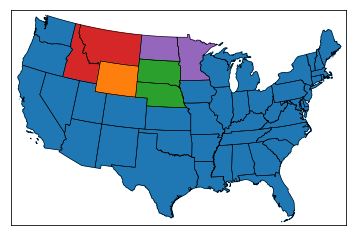

In [39]:
state_plotter(Y1)

In [13]:
from sklearn.neighbors.ball_tree import BallTree
print(BallTree.valid_metrics)

['braycurtis', 'haversine', 'dice', 'l2', 'jaccard', 'canberra', 'hamming', 'euclidean', 'manhattan', 'sokalmichener', 'infinity', 'minkowski', 'kulsinski', 'mahalanobis', 'chebyshev', 'seuclidean', 'matching', 'l1', 'cityblock', 'russellrao', 'pyfunc', 'rogerstanimoto', 'sokalsneath', 'p', 'wminkowski']


0       0
1       0
2       2
3       0
4       2
5       2
6       4
7       2
8       2
9       2
10      3
11      3
12      0
13      0
14      3
15      3
16      2
17      2
18      2
19      2
20      1
21      2
22      2
23      0
24      2
25      0
26      1
27      2
28      2
29      2
       ..
9416    2
9417    0
9418    0
9419    2
9420    2
9421    0
9422    0
9423    4
9424    2
9425    2
9426    0
9427    2
9428    0
9429    2
9430    3
9431    2
9432    2
9433    2
9434    2
9435    2
9436    2
9437    0
9438    2
9439    2
9440    2
9441    2
9442    2
9443    2
9444    2
9445    0
Length: 9446, dtype: int64

In [205]:
list(cols[1])

[0.8901960784313725, 0.46666666666666667, 0.76078431372549016, 1.0]

273


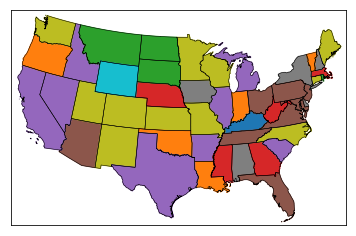

In [293]:
my_tab = pd.crosstab(index=Y,  # Make a crosstab
                              columns="count")
my_tab

In [270]:
len(map.states[2])

15

In [256]:
statenames=[]
for shapedict in m.states_info:
    statename = shapedict['NAME']
    print(statename)
    # skip DC and Puerto Rico.
    if statename not in ['District of Columbia','Puerto Rico']:
        pop = popdensity[statename]
        # calling colormap with value between 0 and 1 returns
        # rgba value.  Invert color range (hot colors are high
        # population), take sqrt root to spread out colors more.
        colors[statename] = cmap(1.-np.sqrt((pop-vmin)/(vmax-vmin)))[:3]
    statenames.append(statename)
len(statenames)

Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Alaska
Minnesota
Washington
Washington
Montana
Idaho
North Dakota
Washington
Washington
Washington
Washington
Washington
Washington
Washington
Washington
Michigan
Washington
Michigan
Maine
Wisconsin
Wisconsin
Wisconsin
Wisconsin
Oregon
South Dakota
Michigan
Michigan
Michigan
Wisconsin
New Hampshire
Michigan
Wisconsin
Michigan
Vermont
New York
Wyoming
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Maine
Mai

273

In [257]:
statenames

['Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Alaska',
 'Minnesota',
 'Washington',
 'Washington',
 'Montana',
 'Idaho',
 'North Dakota',
 'Washington',
 'Washingto

In [194]:
len(categs)

49

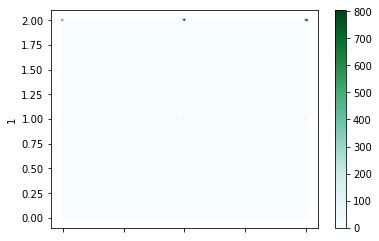

In [50]:
plt.figure();Y1.plot(x=0,y=1,kind="hexbin")

## Build classification battery

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier
from sklearn.metrics import f1_score
from sklearn.neural_network import MLPClassifier
import multiprocessing as mp
import time
import os
import random

seed = 7
random.seed(seed)
np.random.seed(seed)
# prepare models
models = []
models.append(("Dummy",DummyClassifier(strategy="most_frequent")))
#models.append(('LR', LogisticRegression(n_jobs=mp.cpu_count()-8,tol=0.1,class_weight="balanced",random_state=seed)))
models.append(('LDA', LinearDiscriminantAnalysis())) 
models.append(('KNN', KNeighborsClassifier(n_jobs=mp.cpu_count()-9,weights="distance")))
models.append(('CART', DecisionTreeClassifier(random_state=seed)))
models.append(('NB', GaussianNB()))
models.append(('RF',RandomForestClassifier(max_depth=10, n_estimators=50, max_features=1,n_jobs=mp.cpu_count()-9,random_state=seed)))
#models.append(('SVM', LinearSVC(class_weight="balanced",random_state=seed)))
models.append(('MLP', MLPClassifier(solver='lbfgs', alpha=1e-5, 
                                   hidden_layer_sizes=(200,200,200,200,200), random_state=seed)))

In [155]:
X_train, X_test, Y_train, Y_test = \
        train_test_split(X, Y, test_size=.15, random_state=42)

In [156]:
np.shape(X_train)
np.shape(Y_train)

(1612327,)

In [157]:
#apply SMOTE oversampling of minority class to correct for imbalances in the data set
import imblearn.over_sampling
smote_sampler = imblearn.over_sampling.SMOTE(ratio="minority")
X_train,Y_train = smote_sampler.fit_sample(X_train,Y_train)

In [158]:
print(np.shape(X_train))
print(np.shape(Y_train))

(2172782, 700)
(2172782,)


In [ ]:
def test_model_battery(name,model,model_name):
    start_time = time.time()
    model.fit(X_train,Y_train)
    Y_pred = model.predict(X_test)
    label = list(set(Y_train))
    #a = f1_score(Y_test,Y_pred,average='weighted',labels=label)
    sc = f1_score(Y_test,Y_pred,average='weighted',labels=label)
    elapsed_time = time.time() - start_time
    
    with open(model_name+".txt", "a") as myfile:
        myfile.write(str(name)+" "+str(sc)+"\n")
    msg = "%s: %f " % (name, sc)
    print(msg)
    #print(f1_score(Y_test,Y_pred,average='weighted',labels=label))
    #print(Y_pred)
    print("calculated in: "+str(elapsed_time)+"s")

In [116]:
#test_model_battery(models[1][0],models[1][1],"test")
#list(set(Y_train))

LDA: 0.204559 
calculated in: 2.437760353088379s


In [ ]:
'_'.join(np.array(models)[:,0])

In [ ]:
from joblib import Parallel, delayed
model_name = "Regional_2m"
scoring = "f1"
try:
    os.remove(model_name+".txt")
except (FileNotFoundError):
    pass


if __name__ == '__main__':
    Parallel(n_jobs=9)(delayed(test_model_battery)(name,model,model_name) for name,model in models)


/home/servan/anaconda3/lib/python3.5/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Dummy: 0.007855 
calculated in: 0.49235987663269043s
RF: 0.211390 
calculated in: 56.45842170715332s
NB: 0.157266 
calculated in: 206.35569977760315s
CART: 0.256660 
calculated in: 10005.960584402084s


In [ ]:
data = pd.read_csv(model_name+".txt", sep=" ", header=None)
data